<a href="https://colab.research.google.com/github/Acor-Kyudou/Neuro_Motion/blob/main/Training_MTC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install mne torch pytorch-lightning torchmetrics opencv-python matplotlib numpy tensorboard lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 56.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 43.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import mne
from mne.io import concatenate_raws

import os
import re
import io
import cv2
import random
import string
import warnings
import numpy as np
import matplotlib.pyplot as plt
import shutil
from google.colab.patches import cv2_imshow

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torch.nn.functional as F
from torch.autograd import Variable

import pytorch_lightning as pl
from pytorch_lightning import Trainer, seed_everything
from pytorch_lightning.loggers import TensorBoardLogger, CSVLogger
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

from torchmetrics.classification import Accuracy
from pathlib import Path

%matplotlib inline
plt.rcParams['axes.facecolor'] = 'lightgray'

Dataset path exists: /content/drive/MyDrive/dataset/raw_data/files
Contents of /content/drive/MyDrive/dataset/raw_data/files:
['S001', 'S002', 'S003', 'S004', 'S005', 'S006', 'S007', 'S008', 'S009', 'S010']
Searching for EDF files...
Found 237 EDF files
Loading EDF files...
Successfully loaded: /content/drive/MyDrive/dataset/raw_data/files/S001/S001R04.edf
Successfully loaded: /content/drive/MyDrive/dataset/raw_data/files/S001/S001R08.edf
Successfully loaded: /content/drive/MyDrive/dataset/raw_data/files/S001/S001R12.edf
Successfully loaded: /content/drive/MyDrive/dataset/raw_data/files/S002/S002R04.edf
Successfully loaded: /content/drive/MyDrive/dataset/raw_data/files/S002/S002R08.edf
Successfully loaded: /content/drive/MyDrive/dataset/raw_data/files/S002/S002R12.edf
Successfully loaded: /content/drive/MyDrive/dataset/raw_data/files/S003/S003R04.edf
Successfully loaded: /content/drive/MyDrive/dataset/raw_data/files/S003/S003R08.edf
Successfully loaded: /content/drive/MyDrive/dataset/r

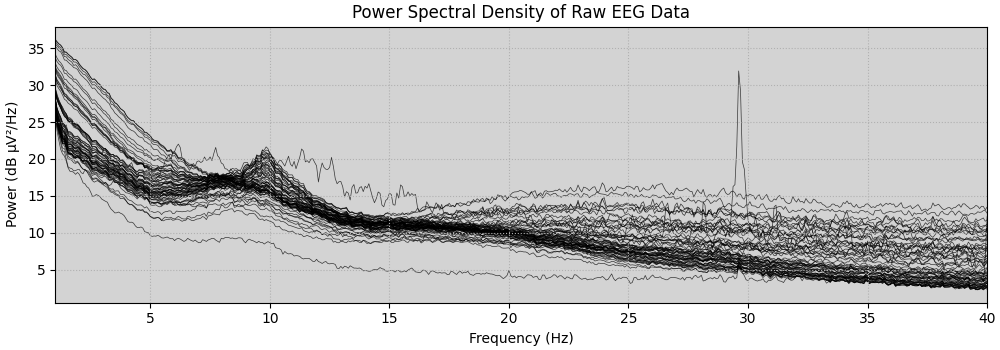

Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Number of EEG channels: 64
Not setting metadata
3555 matching events found
No baseline correction applied
Using data from preloaded Raw for 3555 events and 497 original time points ...
178 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


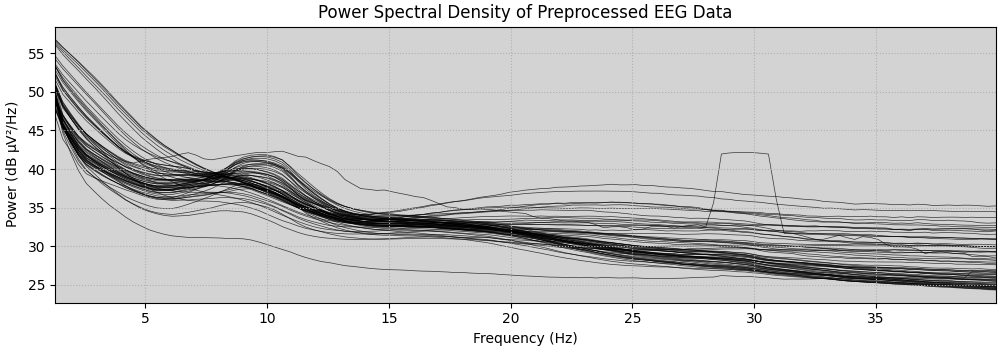

X shape: (3377, 64, 497), y shape: (3377,)


<Figure size 1000x600 with 0 Axes>

<MNELineFigure size 1000x350 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<MNELineFigure size 1000x350 with 0 Axes>

In [ ]:
warnings.filterwarnings("ignore")

N_SUBJECT = 109
BASELINE_EYE_OPEN = [1]
BASELINE_EYE_CLOSED = [2]
OPEN_CLOSE_LEFT_RIGHT_FIST = [3, 7, 11]
IMAGINE_OPEN_CLOSE_LEFT_RIGHT_FIST = [4, 8, 12]
OPEN_CLOSE_BOTH_FIST = [5, 9, 13]
IMAGINE_OPEN_CLOSE_BOTH_FIST = [6, 10, 14]

# Define the base dataset path
DATASET_PATH = r"/content/drive/MyDrive/dataset/raw_data/files"

# Function to get EDF file paths for specific subjects and runs
def get_edf_paths(subject_ids, run_numbers):
    physionet_paths = []
    for subject_id in subject_ids:
        subject_folder = f"S{subject_id:03d}"
        subject_path = os.path.join(DATASET_PATH, subject_folder)
        if not os.path.exists(subject_path):
            print(f"Subject path does not exist: {subject_path}")
            continue
        for run in run_numbers:
            run_file = f"{subject_folder}R{run:02d}.edf"
            file_path = os.path.join(subject_path, run_file)
            if os.path.exists(file_path):
                physionet_paths.append(file_path)
            else:
                print(f"File does not exist: {file_path}")
    return physionet_paths

# Check if the dataset directory exists
if not os.path.exists(DATASET_PATH):
    print(f"Dataset path does not exist: {DATASET_PATH}")
else:
    print(f"Dataset path exists: {DATASET_PATH}")
    # List contents of the dataset directory
    print(f"Contents of {DATASET_PATH}:")
    contents = os.listdir(DATASET_PATH)
    print(contents[:10] if len(contents) > 10 else contents)  # Print first 10 items or all if less

# Load paths for subjects 1 to 79, runs 4, 8, 12
print("Searching for EDF files...")
physionet_paths = get_edf_paths(range(1, 80), IMAGINE_OPEN_CLOSE_LEFT_RIGHT_FIST)
print(f"Found {len(physionet_paths)} EDF files")

if len(physionet_paths) > 0:
    # Load raw EDF files
    print("Loading EDF files...")
    parts = []
    for path in physionet_paths:
        try:
            raw = mne.io.read_raw_edf(
                path,
                preload=True,
                stim_channel='auto',
                verbose='WARNING',
            )
            parts.append(raw)
            print(f"Successfully loaded: {path}")
        except Exception as e:
            print(f"Error loading {path}: {str(e)}")

    print(f"Successfully loaded {len(parts)} out of {len(physionet_paths)} files")

    if len(parts) > 0:
        # Concatenate raw data
        raw = mne.concatenate_raws(parts)
        sample_raw_data = raw.get_data()[0, :500]

        # Visualization: Power Spectral Density (PSD) of raw data
        plt.figure(figsize=(10, 6))
        raw.compute_psd(fmin=1, fmax=40).plot(picks='eeg', show=False)
        plt.title("Power Spectral Density of Raw EEG Data")
        plt.savefig("/content/raw_psd_plot.png")
        plt.clf()
        img = cv2.imread("/content/raw_psd_plot.png")
        cv2_imshow(img)

        # Extract events
        events, _ = mne.events_from_annotations(raw)

        # Pick EEG channels
        eeg_channel_inds = mne.pick_types(
            raw.info,
            meg=False,
            eeg=True,
            stim=False,
            eog=False,
            exclude='bads',
        )

        EEG_CHANNEL = int(len(eeg_channel_inds))
        print(f"Number of EEG channels: {EEG_CHANNEL}")

        # Create epochs
        epoched = mne.Epochs(
            raw,
            events,
            dict(left=2, right=3),
            tmin=1,
            tmax=4.1,
            proj=False,
            picks=eeg_channel_inds,
            baseline=None,
            preload=True
        )

        # Convert data to milliVolt and prepare X, y
        X = (epoched.get_data() * 1e3).astype(np.float32)
        y = (epoched.events[:, 2] - 2).astype(np.int64)

        # Visualization: PSD of preprocessed (epoched) data
        plt.figure(figsize=(10, 6))
        epoched.compute_psd(fmin=1, fmax=40).plot(picks='eeg', show=False)
        plt.title("Power Spectral Density of Preprocessed EEG Data")
        plt.savefig("/content/preprocessed_psd_plot.png")
        plt.clf()
        img = cv2.imread("/content/preprocessed_psd_plot.png")
        cv2_imshow(img)

        CLASSES = ["left", "right"]
        print(f"X shape: {X.shape}, y shape: {y.shape}")
    else:
        print("No EDF files were successfully loaded. Cannot continue.")
else:
    print("No EDF files found. Check dataset path and file structure.")

In [ ]:
class EEGDataset(data.Dataset):
    def __init__(self, x, y=None, inference=False):
        super().__init__()

        N_SAMPLE = x.shape[0]
        val_idx = int(0.9 * N_SAMPLE)
        train_idx = int(0.81 * N_SAMPLE)

        if not inference:
            self.train_ds = {
                'x': x[:train_idx],
                'y': y[:train_idx],
            }
            self.val_ds = {
                'x': x[train_idx:val_idx],
                'y': y[train_idx:val_idx],
            }
            self.test_ds = {
                'x': x[val_idx:],
                'y': y[val_idx:],
            }
        else:
            self.__split = "inference"
            self.inference_ds = {
                'x': [x],
            }

    def __len__(self):
        return len(self.dataset['x'])

    def __getitem__(self, idx):

        x = self.dataset['x'][idx]
        if self.__split != "inference":
            y = self.dataset['y'][idx]
            x = torch.tensor(x).float()
            y = torch.tensor(y).unsqueeze(-1).float()
            return x, y
        else:
            x = torch.tensor(x).float()
            return x

    def split(self, __split):
        self.__split = __split
        return self

    @classmethod
    def inference_dataset(cls, x):
        return cls(x, inference=True)

    @property
    def dataset(self):
        assert self.__split is not None, "Please specify the split of dataset!"

        if self.__split == "train":
            return self.train_ds
        elif self.__split == "val":
            return self.val_ds
        elif self.__split == "test":
            return self.test_ds
        elif self.__split == "inference":
            return self.inference_ds
        else:
            raise TypeError("Unknown type of split!")

In [ ]:
eeg_dataset = EEGDataset(x=X, y=y)

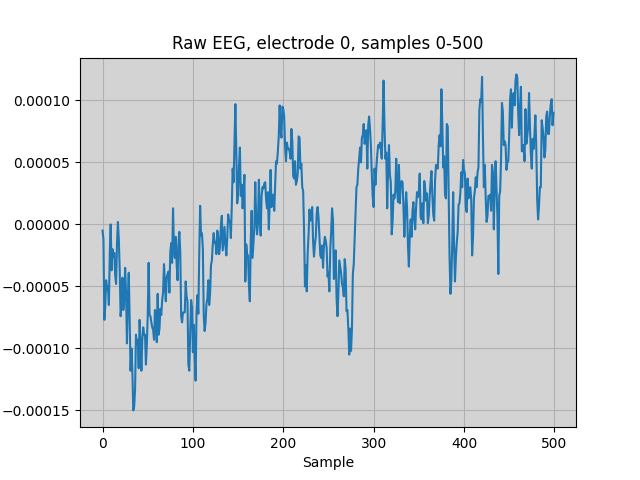

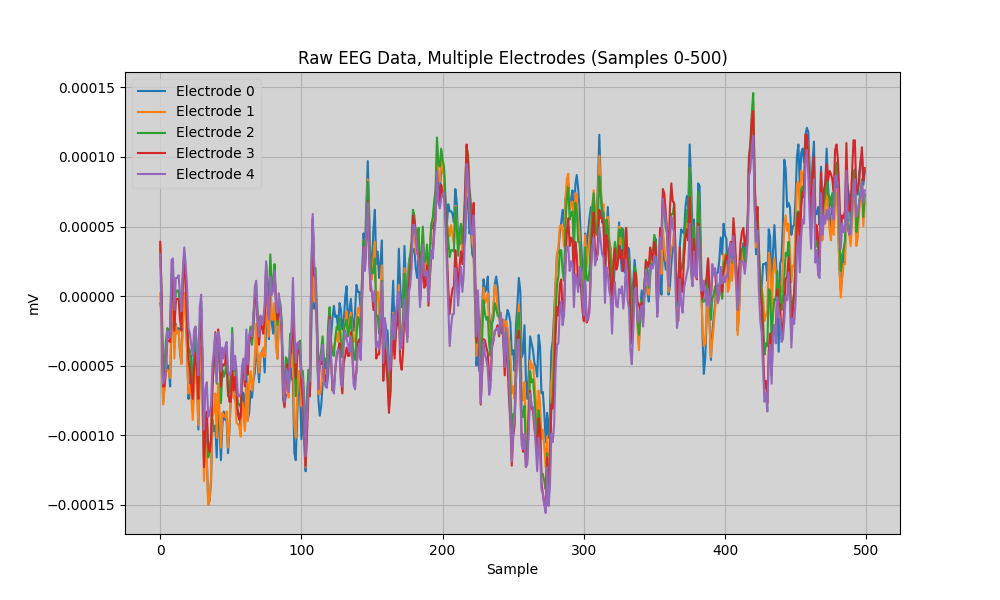

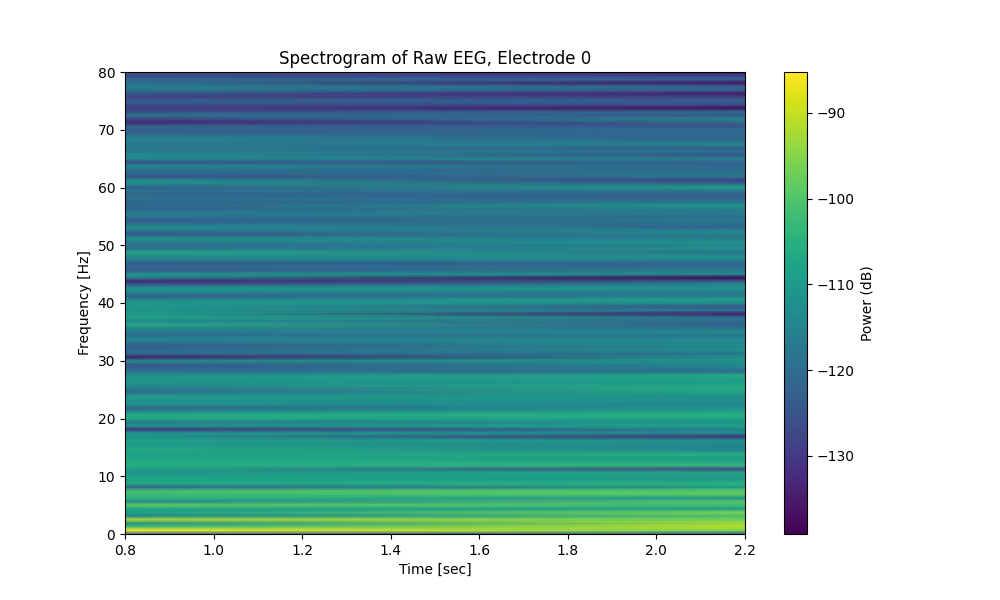

<Figure size 640x480 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

In [ ]:
# Plot for single electrode raw data
plt.plot(sample_raw_data)
plt.title("Raw EEG, electrode 0, samples 0-500")
plt.ylabel("mV")
plt.xlabel("Sample")
plt.grid(True)
plt.savefig("/content/raw_eeg_single.png")
plt.clf()
img = cv2.imread("/content/raw_eeg_single.png")
cv2_imshow(img)

# Additional visualization: Plot multiple electrodes
plt.figure(figsize=(10, 6))
for i in range(min(5, EEG_CHANNEL)):
    plt.plot(raw.get_data()[i, :500], label=f'Electrode {i}')
plt.title("Raw EEG Data, Multiple Electrodes (Samples 0-500)")
plt.ylabel("mV")
plt.xlabel("Sample")
plt.legend()
plt.grid(True)
plt.savefig("/content/raw_eeg_multi.png")
plt.clf()
img = cv2.imread("/content/raw_eeg_multi.png")
cv2_imshow(img)

# Additional visualization: Time-frequency representation (spectrogram) for one electrode
from scipy import signal
fs = raw.info['sfreq']
f, t, Sxx = signal.spectrogram(sample_raw_data, fs=fs)
plt.figure(figsize=(10, 6))
plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
plt.title("Spectrogram of Raw EEG, Electrode 0")
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [sec]")
plt.colorbar(label='Power (dB)')
plt.savefig("/content/raw_spectrogram.png")
plt.clf()
img = cv2.imread("/content/raw_spectrogram.png")
cv2_imshow(img)

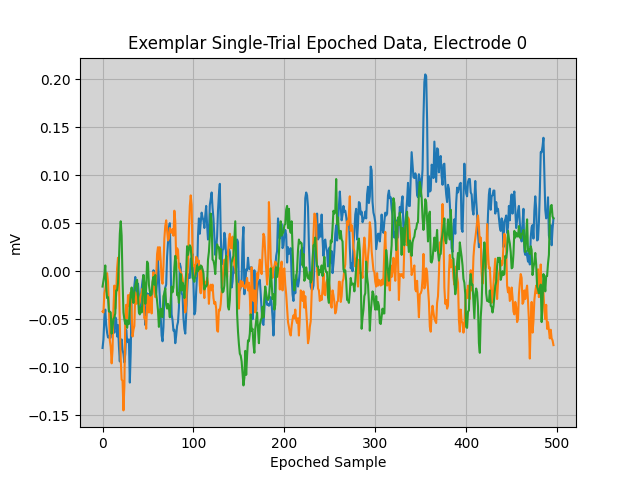

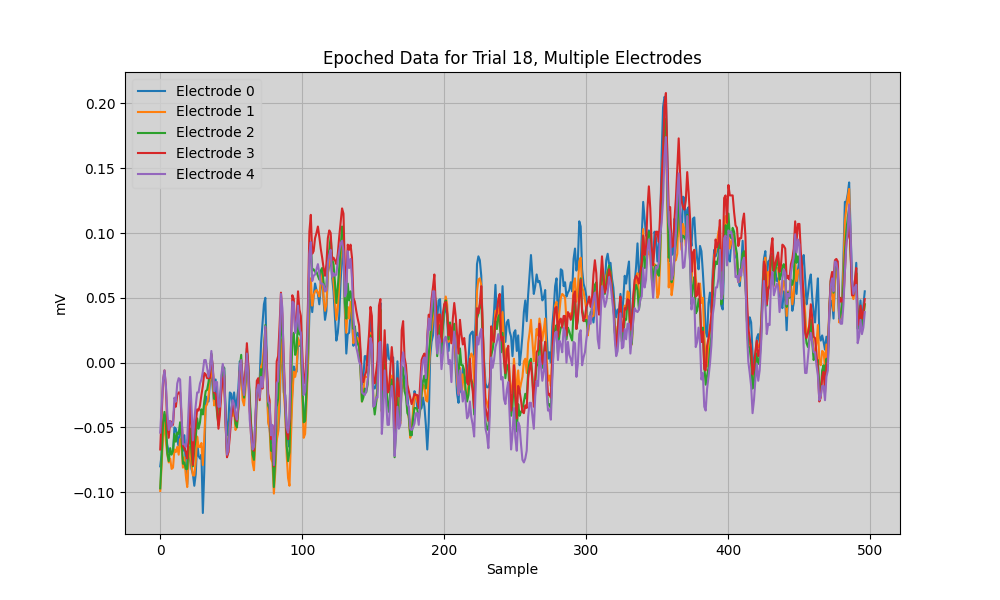

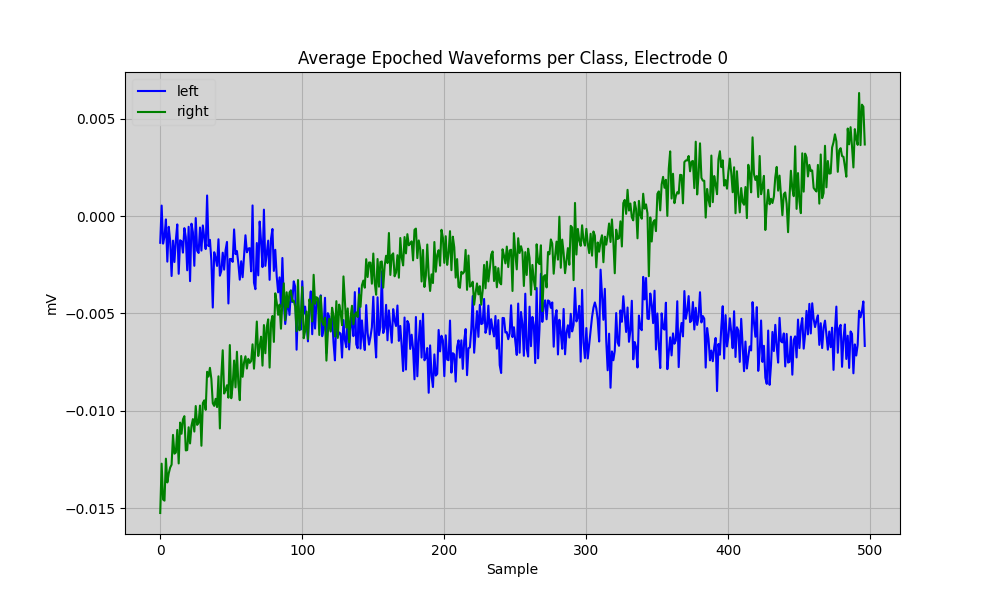

<Figure size 640x480 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

In [ ]:
# Plot exemplar single-trial epoched data
plt.plot(X[18:21, 0, :].T)
plt.title("Exemplar Single-Trial Epoched Data, Electrode 0")
plt.ylabel("mV")
plt.xlabel("Epoched Sample")
plt.grid(True)
plt.savefig("/content/epoched_single_trial.png")
plt.clf()
img = cv2.imread("/content/epoched_single_trial.png")
cv2_imshow(img)

# Additional visualization: Plot epoched data for multiple electrodes
plt.figure(figsize=(10, 6))
for i in range(min(5, EEG_CHANNEL)):
    plt.plot(X[18, i, :], label=f'Electrode {i}')
plt.title("Epoched Data for Trial 18, Multiple Electrodes")
plt.ylabel("mV")
plt.xlabel("Sample")
plt.legend()
plt.grid(True)
plt.savefig("/content/epoched_multi_electrodes.png")
plt.clf()
img = cv2.imread("/content/epoched_multi_electrodes.png")
cv2_imshow(img)

# Additional visualization: Class-specific average waveforms
plt.figure(figsize=(10, 6))
for cls, color in zip([0, 1], ['blue', 'green']):
    class_data = X[y == cls, 0, :].mean(axis=0)
    plt.plot(class_data, label=CLASSES[cls], color=color)
plt.title("Average Epoched Waveforms per Class, Electrode 0")
plt.ylabel("mV")
plt.xlabel("Sample")
plt.legend()
plt.grid(True)
plt.savefig("/content/average_waveforms.png")
plt.clf()
img = cv2.imread("/content/average_waveforms.png")
cv2_imshow(img)

In [ ]:
del raw, events, epoched, physionet_paths, eeg_channel_inds, parts

In [ ]:
class AvgMeter(object):
    def __init__(self, num=40):
        self.num = num
        self.reset()

    def reset(self):
        self.losses = []

    def update(self, val):
        self.losses.append(val)

    def show(self):
        out = torch.mean(
            torch.stack(
                self.losses[np.maximum(len(self.losses)-self.num, 0):]
            )
        )
        return out

In [ ]:
class ModelWrapper(pl.LightningModule):
    def __init__(self, arch, dataset, batch_size, lr, max_epoch):
        super().__init__()

        self.arch = arch
        self.dataset = dataset
        self.batch_size = batch_size
        self.lr = lr
        self.max_epoch = max_epoch

        self.train_accuracy = Accuracy(task="binary")
        self.val_accuracy = Accuracy(task="binary")
        self.test_accuracy = Accuracy(task="binary")

        self.automatic_optimization = False

        self.train_loss = []
        self.val_loss = []

        self.train_acc = []
        self.val_acc = []

        self.train_loss_recorder = AvgMeter()
        self.val_loss_recorder = AvgMeter()

        self.train_acc_recorder = AvgMeter()
        self.val_acc_recorder = AvgMeter()

    def forward(self, x):
        return self.arch(x)

    def training_step(self, batch, batch_nb):
        x, y = batch
        y_hat = self(x)
        loss = F.binary_cross_entropy_with_logits(y_hat, y)
        self.train_accuracy.update(y_hat, y)
        acc = self.train_accuracy.compute().data.cpu()

        opt = self.optimizers()
        opt.zero_grad()
        self.manual_backward(loss)
        opt.step()

        self.train_loss_recorder.update(loss.data)
        self.train_acc_recorder.update(acc)

        self.log("train_loss", loss, prog_bar=True)
        self.log("train_acc", acc, prog_bar=True)

    def on_train_epoch_end(self):
        sch = self.lr_schedulers()
        sch.step()

        self.train_loss.append(self.train_loss_recorder.show().data.cpu().numpy())
        self.train_loss_recorder = AvgMeter()

        self.train_acc.append(self.train_acc_recorder.show().data.cpu().numpy())
        self.train_acc_recorder = AvgMeter()

    def validation_step(self, batch, batch_nb):
        x, y = batch
        y_hat = self(x)
        loss = F.binary_cross_entropy_with_logits(y_hat, y)
        self.val_accuracy.update(y_hat, y)
        acc = self.val_accuracy.compute().data.cpu()

        self.val_loss_recorder.update(loss.data)
        self.val_acc_recorder.update(acc)

        self.log("val_loss", loss, prog_bar=True)
        self.log("val_acc", acc, prog_bar=True)

    def on_validation_epoch_end(self):
        self.val_loss.append(self.val_loss_recorder.show().data.cpu().numpy())
        self.val_loss_recorder = AvgMeter()

        self.val_acc.append(self.val_acc_recorder.show().data.cpu().numpy())
        self.val_acc_recorder = AvgMeter()

    def test_step(self, batch, batch_nb):
        x, y = batch
        y_hat = self(x)
        loss = F.binary_cross_entropy_with_logits(y_hat, y)
        self.test_accuracy.update(y_hat, y)

        self.log(
            "test_loss",
            loss,
            prog_bar=True,
            logger=True,
        )
        self.log(
            "test_acc",
            self.test_accuracy.compute(),
            prog_bar=True,
            logger=True,
        )

    def on_train_end(self):
        from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
        import seaborn as sns

        # Loss plot
        loss_img_file = "/content/loss_plot.png"
        plt.plot(self.train_loss, color='red', label='train')
        plt.plot(self.val_loss, color='green', label='validation')
        plt.title("Loss Curves")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid()
        plt.savefig(loss_img_file)
        plt.clf()
        img = cv2.imread(loss_img_file)
        cv2_imshow(img)

        # Accuracy plot
        acc_img_file = "/content/acc_plot.png"
        plt.plot(self.train_acc, color='blue', label='train')
        plt.plot(self.val_acc, color='green', label='validation')
        plt.title("Accuracy Curves")
        plt.xlabel("Epoch")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid()
        plt.savefig(acc_img_file)
        plt.clf()
        img = cv2.imread(acc_img_file)
        cv2_imshow(img)

        # Additional evaluations on test set
        self.eval()
        test_loader = self.test_dataloader()
        y_true = []
        y_pred = []
        y_scores = []

        with torch.no_grad():
            for batch in test_loader:
                x, y = batch
                y_hat = self(x)
                y_pred.append((y_hat > 0).float().cpu().numpy())
                y_scores.append(torch.sigmoid(y_hat).cpu().numpy())
                y_true.append(y.cpu().numpy())

        y_true = np.concatenate(y_true).flatten()
        y_pred = np.concatenate(y_pred).flatten()
        y_scores = np.concatenate(y_scores).flatten()

        # Confusion Matrix
        cm = confusion_matrix(y_true, y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASSES, yticklabels=CLASSES)
        plt.title("Confusion Matrix")
        plt.ylabel("True Label")
        plt.xlabel("Predicted Label")
        plt.savefig("/content/confusion_matrix.png")
        plt.clf()
        img = cv2.imread("/content/confusion_matrix.png")
        cv2_imshow(img)

        # Classification Report
        report = classification_report(y_true, y_pred, target_names=CLASSES, output_dict=True)
        print("Classification Report:")
        print(classification_report(y_true, y_pred, target_names=CLASSES))

        # ROC Curve
        fpr, tpr, _ = roc_curve(y_true, y_scores)
        roc_auc = auc(fpr, tpr)
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='red', label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='green', linestyle='--')
        plt.title("Receiver Operating Characteristic (ROC) Curve")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend()
        plt.grid()
        plt.savefig("/content/roc_curve.png")
        plt.clf()
        img = cv2.imread("/content/roc_curve.png")
        cv2_imshow(img)

        # Precision-Recall Curve
        from sklearn.metrics import precision_recall_curve
        precision, recall, _ = precision_recall_curve(y_true, y_scores)
        plt.figure(figsize=(8, 6))
        plt.plot(recall, precision, color='green', label='Precision-Recall curve')
        plt.title("Precision-Recall Curve")
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.legend()
        plt.grid()
        plt.savefig("/content/pr_curve.png")
        plt.clf()
        img = cv2.imread("/content/pr_curve.png")
        cv2_imshow(img)

    def train_dataloader(self):
        return data.DataLoader(
            dataset=self.dataset.split("train"),
            batch_size=self.batch_size,
            shuffle=True,
        )

    def val_dataloader(self):
        return data.DataLoader(
            dataset=self.dataset.split("val"),
            batch_size=self.batch_size,
            shuffle=False,
        )

    def test_dataloader(self):
        return data.DataLoader(
            dataset=self.dataset.split("test"),
            batch_size=1,
            shuffle=False,
        )

    def configure_optimizers(self):
        optimizer = optim.Adam(
            self.parameters(),
            lr=self.lr,
        )
        lr_scheduler = {
            "scheduler": optim.lr_scheduler.MultiStepLR(
                optimizer,
                milestones=[
                    int(self.max_epoch * 0.25),
                    int(self.max_epoch * 0.5),
                    int(self.max_epoch * 0.75),
                ],
                gamma=0.1
            ),
            "name": "lr_scheduler",
        }
        return [optimizer], [lr_scheduler]

In [ ]:
class PositionalEncoding(nn.Module):
    def __init__(self, num_hiddens, dropout, max_len=1000):
        super().__init__()
        self.dropout = nn.Dropout(dropout)
        # Create a long enough P
        self.p = torch.zeros((1, max_len, num_hiddens))
        x = torch.arange(max_len, dtype=torch.float32).reshape(
            -1, 1) / torch.pow(10000, torch.arange(
            0, num_hiddens, 2, dtype=torch.float32) / num_hiddens)
        self.p[:, :, 0::2] = torch.sin(x)
        self.p[:, :, 1::2] = torch.cos(x)

    def forward(self, x):
        x = x + self.p[:, :x.shape[1], :].to(x.device)
        return self.dropout(x)

In [ ]:
class TransformerBlock(nn.Module):
    def __init__(self, embed_dim, num_heads, dim_feedforward, dropout=0.1):
        super().__init__()

        self.attention = nn.MultiheadAttention(
            embed_dim,
            num_heads,
            dropout,
            batch_first=True,
        )
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, dim_feedforward),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(dim_feedforward, embed_dim),
        )

        self.layernorm0 = nn.LayerNorm(embed_dim)
        self.layernorm1 = nn.LayerNorm(embed_dim)

        self.dropout = dropout

    def forward(self, x):
        y, att = self.attention(x, x, x)
        y = F.dropout(y, self.dropout, training=self.training)
        x = self.layernorm0(x + y)
        y = self.mlp(x)
        y = F.dropout(y, self.dropout, training=self.training)
        x = self.layernorm1(x + y)
        return x

In [ ]:
class EEGClassificationModel(nn.Module):
    def __init__(self, eeg_channel, dropout=0.1):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv1d(
                eeg_channel, eeg_channel, 11, 1, padding=5, bias=False
            ),
            nn.BatchNorm1d(eeg_channel),
            nn.ReLU(True),
            nn.Dropout1d(dropout),
            nn.Conv1d(
                eeg_channel, eeg_channel * 2, 11, 1, padding=5, bias=False
            ),
            nn.BatchNorm1d(eeg_channel * 2),
        )

        self.transformer = nn.Sequential(
            PositionalEncoding(eeg_channel * 2, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
        )

        self.mlp = nn.Sequential(
            nn.Linear(eeg_channel * 2, eeg_channel // 2),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(eeg_channel // 2, 1),
        )

    def forward(self, x):
        x = self.conv(x)
        x = x.permute(0, 2, 1)
        x = self.transformer(x)
        x = x.permute(0, 2, 1)
        x = x.mean(dim=-1)
        x = self.mlp(x)
        return x

In [ ]:
MODEL_NAME = "EEGClassificationModel"
model = EEGClassificationModel(eeg_channel=EEG_CHANNEL, dropout=0.125)

MAX_EPOCH = 100
BATCH_SIZE = 10
LR = 5e-4
CHECKPOINT_DIR = os.getcwd()
SEED = int(np.random.randint(2147483647))

print(f"Random seed: {SEED}")

model = ModelWrapper(model, eeg_dataset, BATCH_SIZE, LR, MAX_EPOCH)

# Ensure log directory exists
os.makedirs("logs/lightning_logs", exist_ok=True)

!rm -rf logs/lightning_logs/*

Random seed: 784415750


INFO:lightning_fabric.utilities.seed:Seed set to 784415750
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | arch           | EEGClassificationModel | 277 K  | train
1 | train_accuracy | BinaryAccuracy         | 0      | train
2 | val_accuracy   | BinaryAccuracy         | 0      | train
3 | test_accuracy  | BinaryAccuracy         | 0      | train
------------------------------------------------------------------
277 K     Trainable params
0         Non-trainable params
277 K     Total params
1.109     Total estimated model params size (MB)
39        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


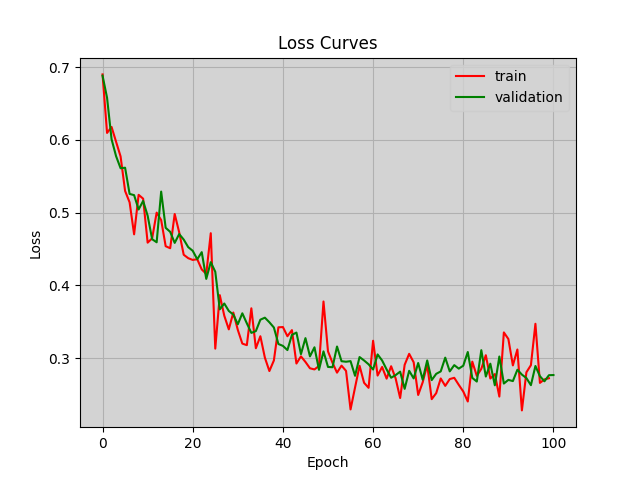

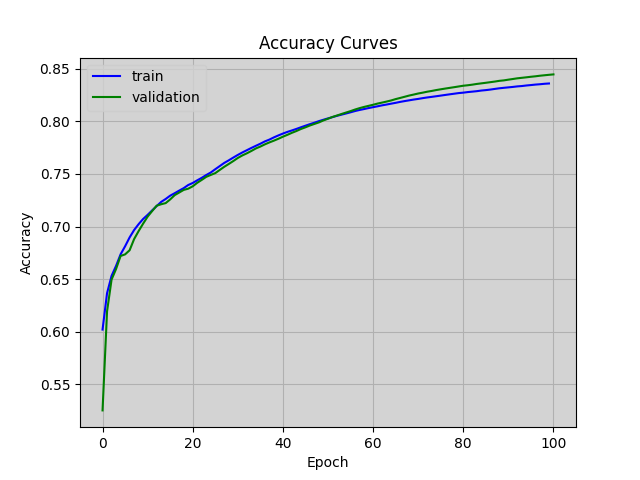

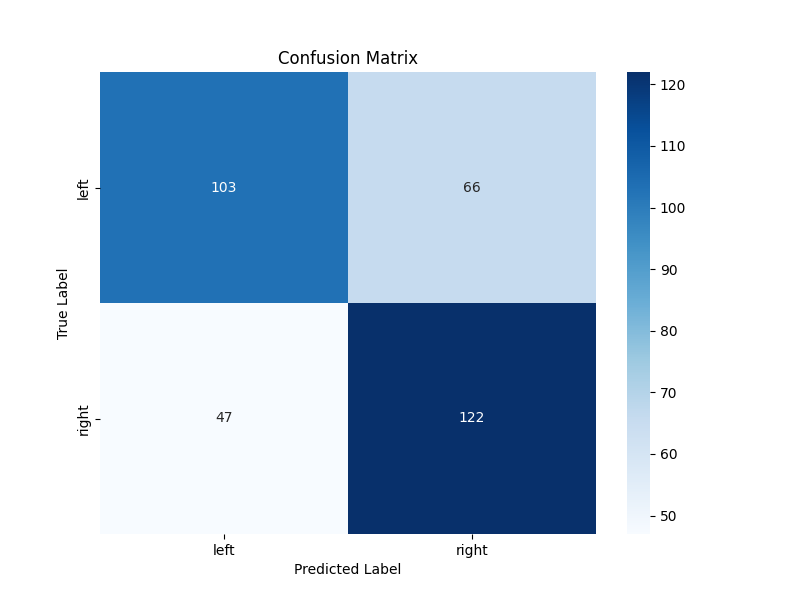

Classification Report:
              precision    recall  f1-score   support

        left       0.69      0.61      0.65       169
       right       0.65      0.72      0.68       169

    accuracy                           0.67       338
   macro avg       0.67      0.67      0.66       338
weighted avg       0.67      0.67      0.66       338



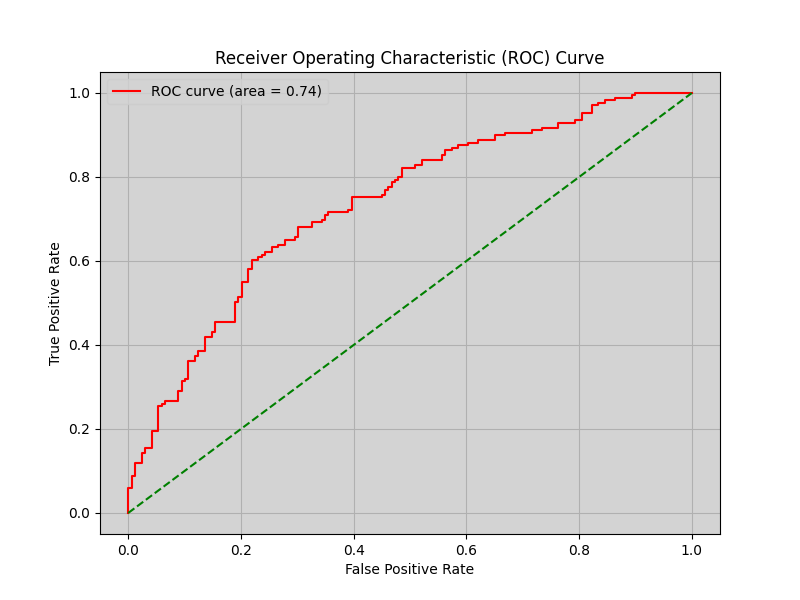

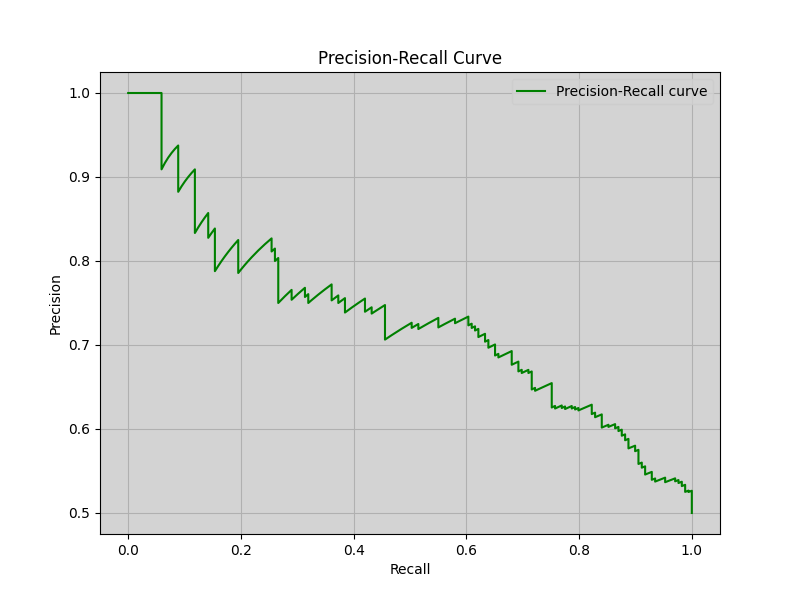

<Figure size 640x480 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [ ]:
tensorboardlogger = TensorBoardLogger(save_dir="logs/")
csvlogger = CSVLogger(save_dir="logs/")
lr_monitor = LearningRateMonitor(logging_interval='step')
checkpoint = ModelCheckpoint(
    monitor='val_acc',
    dirpath=CHECKPOINT_DIR,
    mode='max',
)
early_stopping = EarlyStopping(
    monitor="val_acc", min_delta=0.00, patience=3, verbose=False, mode="max"
)

seed_everything(SEED, workers=True)

trainer = pl.Trainer(
    accelerator="auto",
    devices=1,
    max_epochs=MAX_EPOCH,
    logger=[tensorboardlogger, csvlogger],
    callbacks=[lr_monitor, checkpoint, early_stopping],
    log_every_n_steps=5,
)
trainer.fit(model)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=logs/lightning_logs/

<IPython.core.display.Javascript object>

In [ ]:
!pip install onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 51.1 MB/s eta 0:00:00


In [ ]:
# Define the directory to save models
SAVE_DIR = "/content/drive/MyDrive/dataset/EEGMotorImagery-master"  # Manually specify your directory here
os.makedirs(SAVE_DIR, exist_ok=True)  # Create directory if it doesn't exist

# 1. Save in native PyTorch format (state_dict)
torch.save(model.arch.state_dict(), os.path.join(SAVE_DIR, "model_pytorch.pth"))

# 2. Save in PyTorch Lightning format (checkpoint)
trainer.save_checkpoint(os.path.join(SAVE_DIR, "model_lightning.ckpt"))

# 3. Save in ONNX format
model.eval()  # Set model to evaluation mode
dummy_input = torch.randn(1, EEG_CHANNEL, int(4.1 * 160))  # [batch, channels, timepoints]
torch.onnx.export(
    model.arch,  # Export the underlying PyTorch model
    dummy_input,
    os.path.join(SAVE_DIR, "model.onnx"),
    opset_version=13,  # Use opset 13 to support aten::unflatten
    input_names=["input"],
    output_names=["output"],
    dynamic_axes={"input": {0: "batch_size"}, "output": {0: "batch_size"}}
)
print(f"Models saved in {SAVE_DIR}")

Models saved in /content/drive/MyDrive/dataset/EEGMotorImagery-master
